# GVHD project — T cell only batch correction

# Azizi lab Lingting Shi

In [1]:
import anndata as ad
import anndata
import gc
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import scvi
from pathlib import Path

/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_csv from `anndata` is deprecated. Import anndata.io.read_csv instead.
  warnings.warn(msg, FutureWarning)
/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_loom from `anndata` is deprecated. Import anndata.io.read_loom instead.
  warnings.warn(msg, FutureWarning)
/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)
/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Importing CSCDataset from `anndata.experimental` is deprecated. Import anndata.abc.CSCDataset instead.
  warnings.warn(msg, FutureWarning)
/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/anndata/utils.py:429: FutureWarning: Impo

In [2]:
scvi.settings.seed = 0
# for reproducibility

Seed set to 0


In [3]:
# Paths — relative to this notebook's location (GVHD_Reproducibility-main/Sc&TCR_Pipelines/)
PROJECT_ROOT          = Path('../..')

# Input: annotated all-cell object produced by the annotation notebook
FILTERED_PATH        = PROJECT_ROOT / 'adata_file' / 'filtered_combined.h5ad'

# Output paths
SCVI_TCELL_MODEL_PATH = PROJECT_ROOT / 'adata_file' / 'model_scvi_tcell'
OUTPUT_TCELL_PATH     = PROJECT_ROOT / 'adata_file' / 'tcell_batch_corrected.h5ad'

In [4]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.set_figure_params(dpi=80)

-----
anndata     0.11.1
scanpy      1.10.4
-----
Cython                      3.0.12
PIL                         11.0.0
absl                        NA
anyio                       NA
appnope                     0.1.4
arrow                       1.3.0
asttokens                   NA
attr                        24.2.0
attrs                       24.2.0
babel                       2.16.0
certifi                     2024.08.30
charset_normalizer          3.4.0
chex                        0.1.87
comm                        0.2.2
cycler                      0.12.1
cython                      3.0.12
cython_runtime              NA
dateutil                    2.9.0.post0
debugpy                     1.8.9
decorator                   5.1.1
defusedxml                  0.7.1
docrep                      0.3.2
etils                       1.11.0
executing                   2.1.0
fastjsonschema              NA
filelock                    3.16.1
flax                        0.10.2
fqdn                     

/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/session_info/main.py:213: UserWarning: The '__version__' attribute is deprecated and will be removed in MarkupSafe 3.1. Use feature detection, or `importlib.metadata.version("markupsafe")`, instead.
  mod_version = _find_version(mod.__version__)


# Loading data

In [5]:
Tcell_ann = anndata.read_h5ad(FILTERED_PATH)

In [6]:
Tcell_ann = Tcell_ann[Tcell_ann.obs['leiden_0.15'].isin(['0', '5']), :].copy()

# Preprocessing

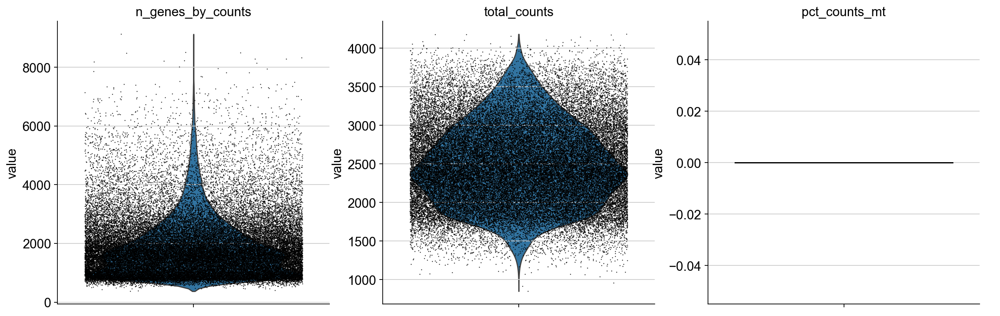

In [7]:
sc.pl.violin(Tcell_ann, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True)

In [8]:
Tcell_ann.layers['counts'].max()

9734.0

In [9]:
# 1. Check batch sizes first
print(Tcell_ann.obs['PatientID'].value_counts())

PatientID
C66      12069
R085      6586
C98       6018
ND001     4886
C068      3754
R096      3263
C160      2768
C159      2558
C179      2324
C157      1683
C152      1347
C155      1190
C86        734
ND003      698
C162       491
C101        47
Name: count, dtype: int64


In [10]:
# Remove tiny batches before HVG selection
min_cells = 100  # or even 50, but 47 is clearly too few
Tcell_ann_hvg = Tcell_ann[
    Tcell_ann.obs['PatientID'].isin(
        Tcell_ann.obs['PatientID'].value_counts()[
            Tcell_ann.obs['PatientID'].value_counts() >= min_cells
        ].index
    )
].copy()

sc.pp.highly_variable_genes(
    Tcell_ann_hvg,
    n_top_genes=5000,
    subset=False,
    layer='counts',
    batch_key='PatientID',
    flavor='seurat_v3'
)

# Transfer HVG results back to full object
Tcell_ann.var['highly_variable'] = Tcell_ann_hvg.var['highly_variable']

extracting highly variable genes


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


In [11]:
# T cell key genes — always include these regardless of HVG selection
tcell_key_genes = [
    # Pan-T cell
    'CD3D', 'CD3E', 'CD3G', 'CD247',
    # Lineage
    'CD4', 'CD8A', 'CD8B',
    # Effector / cytotoxic
    'GZMB', 'GZMA', 'GZMK', 'GZMH', 'PRF1', 'NKG7',
    # Regulatory T cells
    'FOXP3', 'IL2RA', 'IKZF2',
    # Tissue-resident memory
    'ITGAE', 'ZNF683', 'CXCR6',
    # Naive / central memory
    'CCR7', 'SELL', 'TCF7', 'LEF1',
    # Effector memory / terminal
    'CX3CR1', 'KLRG1',
    # Memory marker
    'IL7R',
    # Immune checkpoint / exhaustion
    'PDCD1', 'CTLA4', 'TIGIT', 'LAG3', 'HAVCR2', 'TOX',
    # Transcription factors
    'TBX21', 'EOMES', 'RORC', 'GATA3',
    # Proliferation
    'MKI67', 'TOP2A',
    # Homing / chemokine receptors
    'CXCR3', 'CCR5', 'CXCR4',
    # Unconventional T cells / IEL
    'TRDC', 'TRGC1', 'TRGC2', 'KLRB1', 'KLRD1', 'NCAM1',
    # Cytokines
    'IFNG', 'TNF', 'IL2', 'IL10', 'IL17A',
]

add_genes = [g for g in tcell_key_genes if g in Tcell_ann.var.index]
print(f'Key genes found in dataset: {len(add_genes)} / {len(tcell_key_genes)}')
print(add_genes)

Key genes found in dataset: 52 / 52
['CD3D', 'CD3E', 'CD3G', 'CD247', 'CD4', 'CD8A', 'CD8B', 'GZMB', 'GZMA', 'GZMK', 'GZMH', 'PRF1', 'NKG7', 'FOXP3', 'IL2RA', 'IKZF2', 'ITGAE', 'ZNF683', 'CXCR6', 'CCR7', 'SELL', 'TCF7', 'LEF1', 'CX3CR1', 'KLRG1', 'IL7R', 'PDCD1', 'CTLA4', 'TIGIT', 'LAG3', 'HAVCR2', 'TOX', 'TBX21', 'EOMES', 'RORC', 'GATA3', 'MKI67', 'TOP2A', 'CXCR3', 'CCR5', 'CXCR4', 'TRDC', 'TRGC1', 'TRGC2', 'KLRB1', 'KLRD1', 'NCAM1', 'IFNG', 'TNF', 'IL2', 'IL10', 'IL17A']


In [12]:
highly_var   = list(Tcell_ann.var[Tcell_ann.var['highly_variable'] == True].index)
merged_set   = set(add_genes) | set(highly_var)
print(f'Total genes after merging HVG + key genes: {len(merged_set)}')

Total genes after merging HVG + key genes: 5005


In [13]:
# Filter to the merged gene set
Tcell_ann_high = Tcell_ann[:, Tcell_ann.var['highly_variable'].index.isin(merged_set)].copy()
Tcell_ann_high

AnnData object with n_obs × n_vars = 50416 × 5005
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'hvg', 'leiden', 'leiden_0.15', 'leiden_0.15_colors', 'leiden_colors', 'log1p', 'neighbors', 'rank_genes_groups', 'umap'
    obsm: 'X_scVI', 'X_umap', 'scvi'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

# scVI batch correction

In [14]:
scvi.model.SCVI.setup_anndata(Tcell_ann_high, batch_key='PatientID', layer='counts')

In [15]:
vae = scvi.model.SCVI(Tcell_ann_high, n_latent=30, gene_likelihood='nb')

In [16]:
#vae.train()


In [17]:
#vae.save(SCVI_TCELL_MODEL_PATH)

In [18]:
# Load saved model for reproducibility
vae = scvi.model.SCVI.load(SCVI_TCELL_MODEL_PATH, adata=Tcell_ann_high)

INFO     File ../../adata_file/model_scvi_tcell/model.pt already downloaded                                        


/Users/lingting/ENTER/envs/mrvi/lib/python3.11/site-packages/scvi/model/base/_save_load.py:76: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load(model_path, m

In [19]:
Tcell_ann_high.obsm['X_scVI']          = vae.get_latent_representation()
Tcell_ann_high.layers['scvi_normalized'] = vae.get_normalized_expression(library_size=10e4)
Tcell_ann_high.obsm['scvi']            = Tcell_ann_high.layers['scvi_normalized']

In [20]:
Tcell_ann.obsm['X_scVI'] = Tcell_ann_high.obsm["X_scVI"]
Tcell_ann.obsm['scvi'] = Tcell_ann_high.obsm["scvi"]

In [21]:
Tcell_ann.X.max()

8.382051

In [22]:
Tcell_ann.layers['counts'].max()

9734.0

# UMAP visualization

In [23]:
sc.pp.neighbors(Tcell_ann, use_rep='X_scVI', random_state=0, n_neighbors=50)
sc.tl.umap(Tcell_ann, random_state=0)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:18)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:26)


running Leiden clustering


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_53560/4117020926.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(Tcell_ann,resolution=0.7,key_added='leiden', random_state=0)


    finished: found 12 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:01:04)


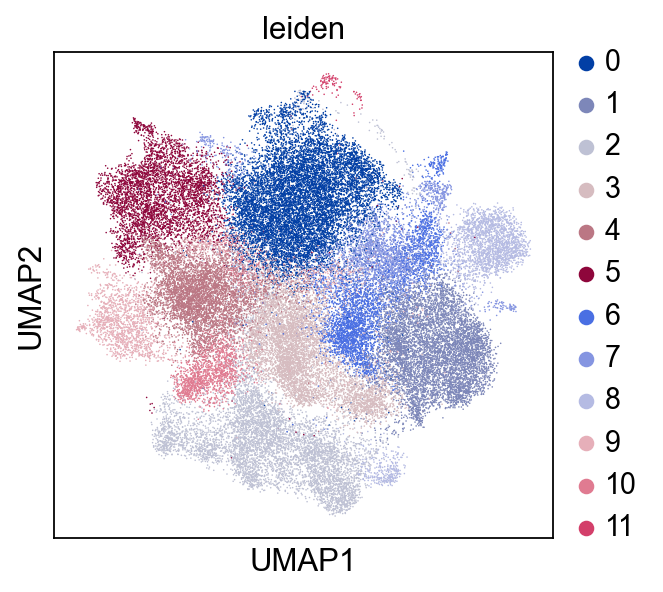

In [24]:
# Use low resolution first to identify major T cell populations
sc.tl.leiden(Tcell_ann,resolution=0.7,key_added='leiden', random_state=0)
sc.pl.umap(Tcell_ann, color=['leiden'], s =2)

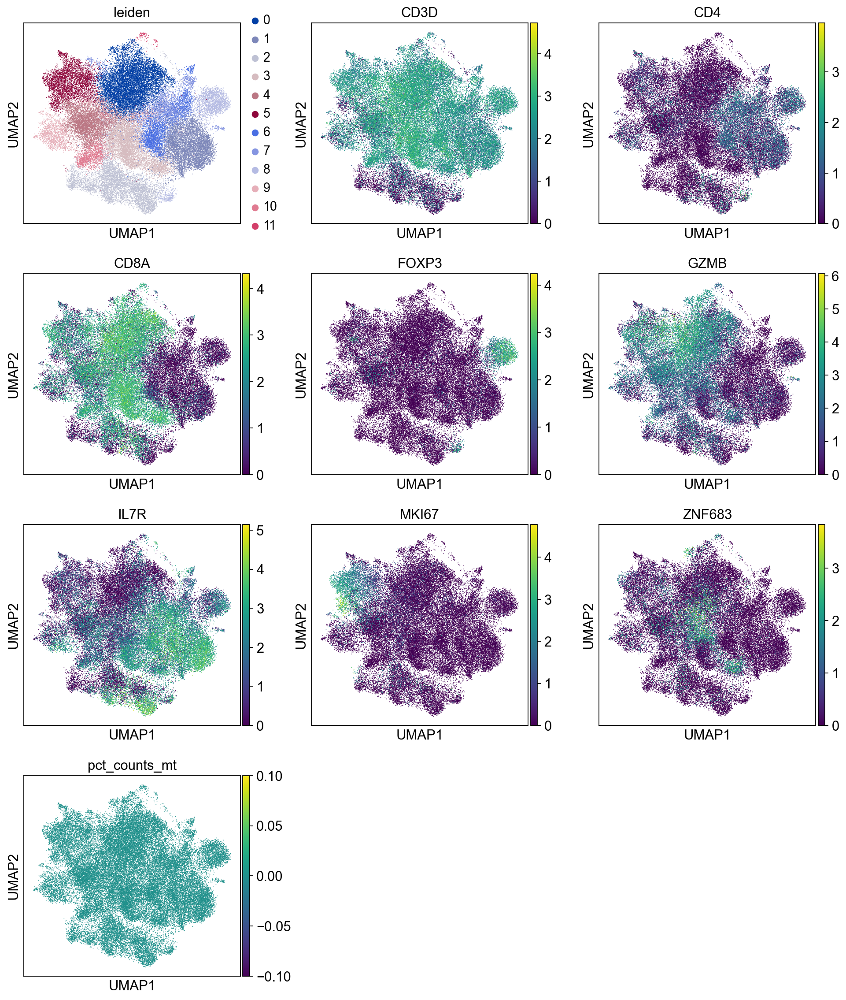

In [25]:
sc.pl.umap(Tcell_ann, color=['leiden', 'CD3D', 'CD4', 'CD8A', 'FOXP3',
                             'GZMB', 'IL7R', 'MKI67', 'ZNF683', 'pct_counts_mt'],
           ncols=3)

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_53560/1664535478.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  hue=Tcell_ann.obs[meta][randomize],
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_53560/1664535478.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  hue=Tcell_ann.obs[meta][randomize],
/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_53560/1664535478.py:10: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position,

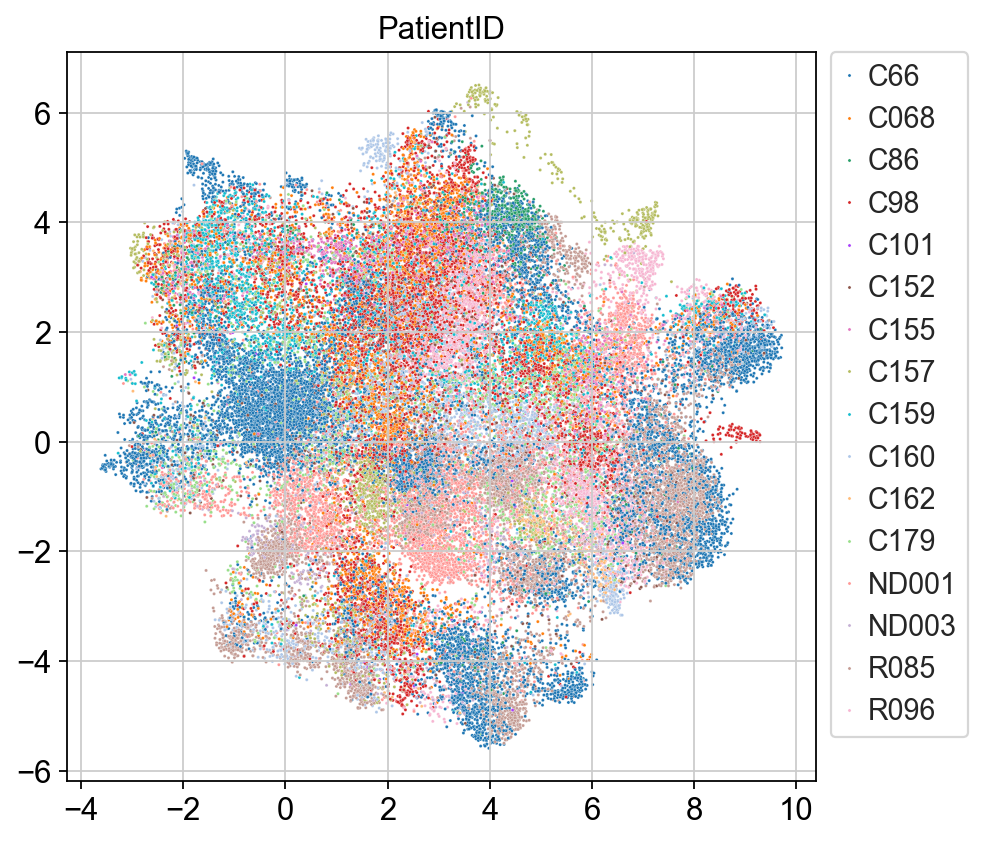

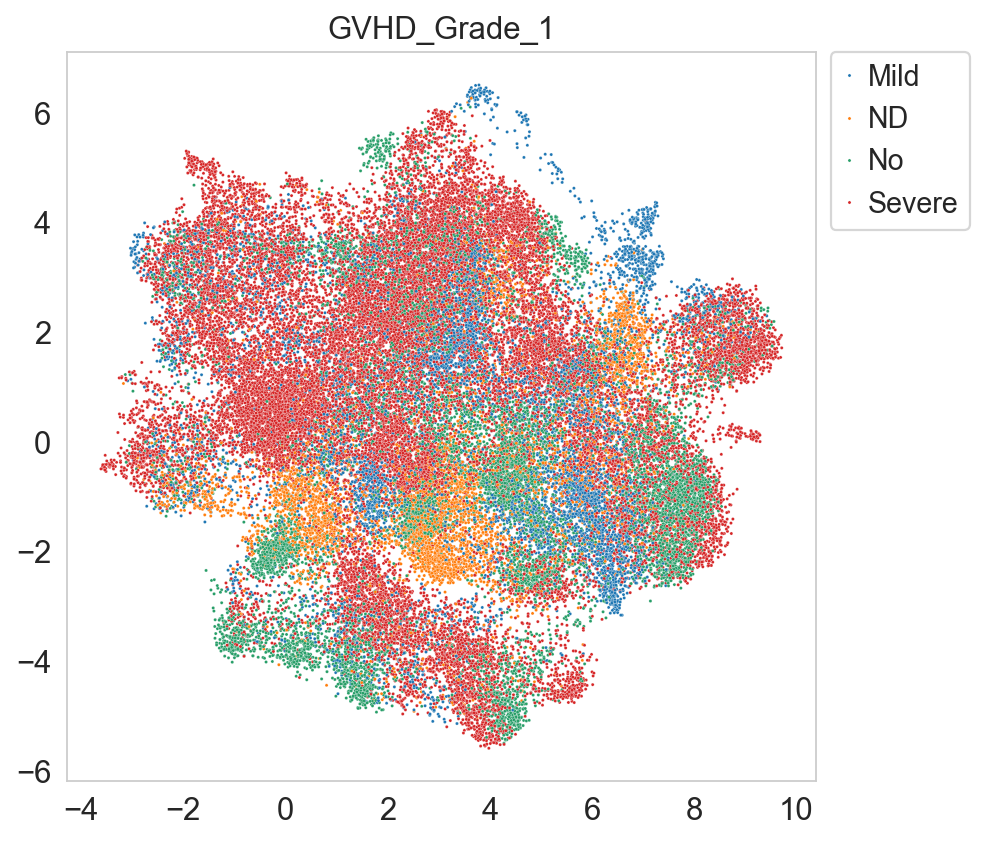

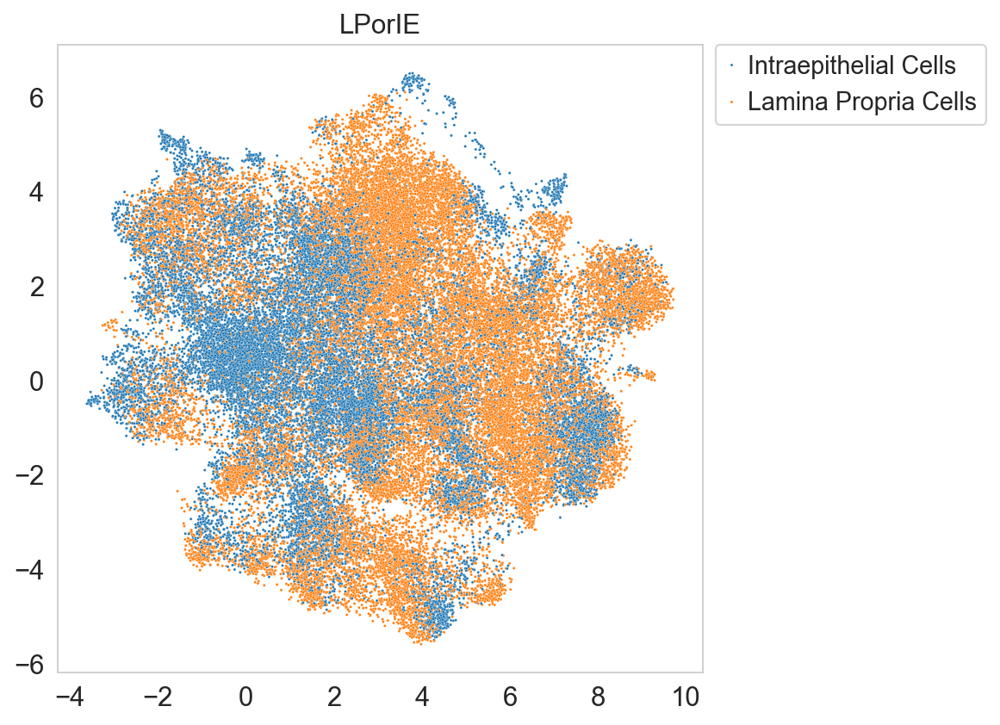

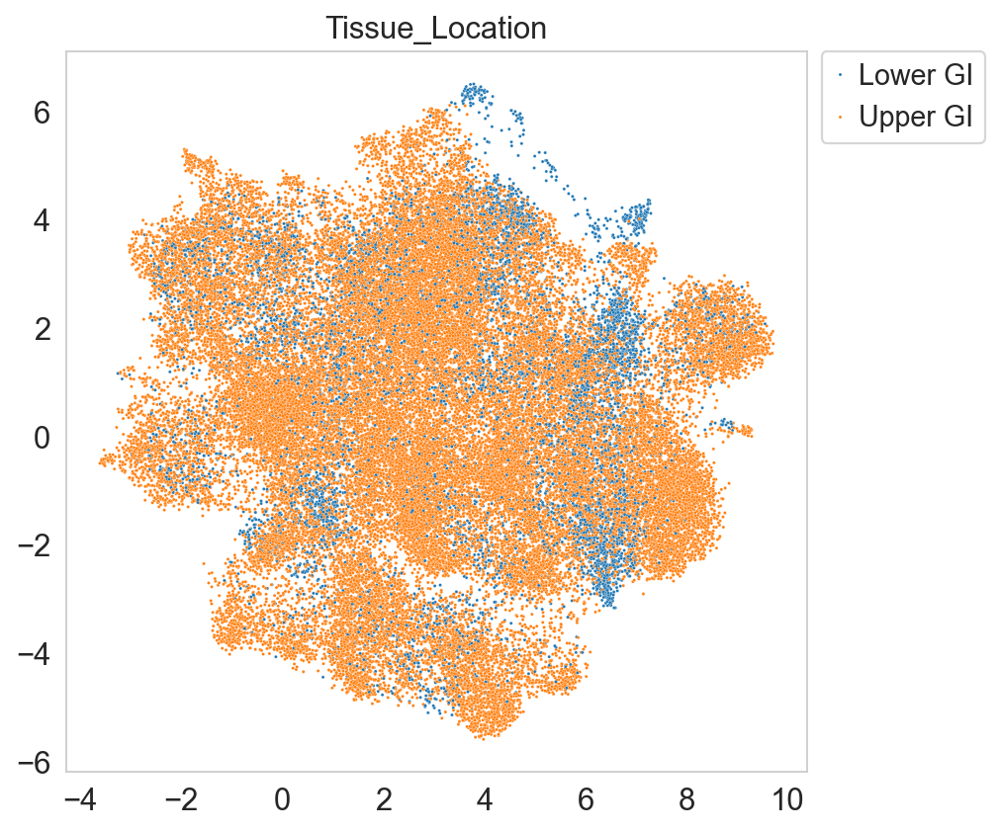

In [26]:
# plot metadata
for meta in ['PatientID', 'GVHD_Grade_1', 'LPorIE', 'Tissue_Location']:
    randomize = np.arange(Tcell_ann.n_obs)
    np.random.shuffle(randomize)
    fig, ax = plt.subplots(figsize=(6, 6))
    sns.set_style('whitegrid', {'axes.grid': False})
    sns.scatterplot(
        x=Tcell_ann.obsm['X_umap'][:, 0][randomize],
        y=Tcell_ann.obsm['X_umap'][:, 1][randomize],
        hue=Tcell_ann.obs[meta][randomize],
        s=2, ax=ax
    ).set(title=meta)
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)

In [27]:
Tcell_ann.write(OUTPUT_TCELL_PATH)